In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import os
import pandas as pd
import missingno as msno
import seaborn as sns
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict
from sklearn.model_selection import GroupShuffleSplit, ShuffleSplit, LeaveOneOut, GridSearchCV
from sklearn import linear_model
from sklearn.tree import _tree, export_graphviz, DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, median_absolute_error
from sklearn.externals import joblib
import graphviz
import numpy as np
import seaborn as sns
%matplotlib inline

pd.options.display.max_columns=100
pd.options.display.max_rows=100

In [2]:
df = pd.read_excel(os.path.join('rawdata', 'Aeon Water Data 10-9-17.xlsx'))
cols = df.columns.tolist()
cols = [col.lower() for col in cols]
df.columns = cols
print('Size of the dataframe is:  {}'.format(df.shape))
print('Test for null values:  {}'.format(df.isnull().any().any()))
df.dtypes

Size of the dataframe is:  (4391, 62)
Test for null values:  True


yardi building name                      object
match building name                      object
month                                    object
year                                      int64
month start date                         object
total # bedrooms  in building             int64
gallons per bedroom per month           float64
gallons per building per month          float64
year built/gut rehabbed                   int64
single family?                           object
single family building type              object
low-income housing                       object
predominant resident type                object
type of construction                     object
is there a basement?                     object
is basement finished & heated?           object
gross bldg sq ft                        float64
if multi-family sum of apt sq ft          int64
basement sq ft                            int64
# stories                               float64
if multi-family, # units                

## Visual Assessment Of Empty Rows

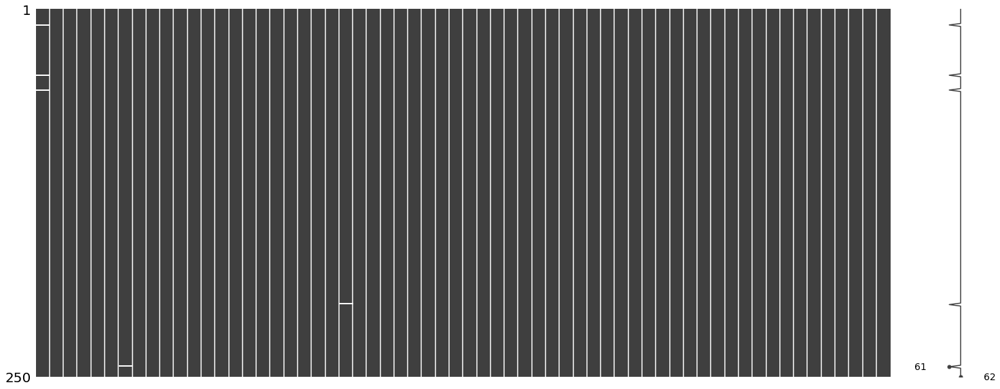

In [3]:
msno.matrix(df.sample(250))

In [4]:
# For the sake of expedient modeling, drop the rows that have missing values
print(df.loc[df.isnull().any(axis=1)].shape)
df = df.dropna()

(109, 62)


In [5]:
# Rename the target columns and calculate an age for each building

df.rename(columns={'gallons per building per month': 'target'}, inplace=True)
df = df.assign(bldg_age=df['year'] - df['year built/gut rehabbed'])

In [6]:
# Convert the yearly values to strings
df[['year', 'year built/gut rehabbed']] = df[
    ['year', 'year built/gut rehabbed']].astype(str)
numerical = df.loc[:, df.dtypes != 'object']
numerical.head()

,total # bedrooms in building,gallons per bedroom per month,target,gross bldg sq ft,if multi-family sum of apt sq ft,basement sq ft,# stories,"if multi-family, # units",# elevators,# of days in month,# of 0 bedroom units in building,# of 1 bedroom units in building,# of 2 bedroom units in building,# of 3 bedroom units in building,# of 4 bedroom units in building,# of 5 bedroom units in building,0 bedrooms - days vacant,1 bedrooms days vacant,2 bedrooms days vacant,3 bedrooms days vacant,4 bedrooms days vacant,5 bedrooms days vacant,# of 0 bedrooms * days in month,# of 1 bedrooms * days in month,# of 2 bedrooms * days in month,# of 3 bedrooms * days in month,# of 4 bedrooms * days in month,# of 5 bedrooms * days in month,0 bedrooms- days occupied,1 bedrooms - days occupied,2 bedrooms - days occupied,3 bedrooms - days occupied,4 bedrooms - days occupied,5 bedrooms - days occupied,0 bedroom number of vacant units,1 bedroom number of vacant units,2 bedroom number of vacant units,3 bedroom number of vacant units,4 bedroom number of vacant units,5 bedroom number of vacant units,bldg_age
0,18,1714.6111,30862.9998,18000.0,9772,4500,4.0,18,0,31,0,18,0,0,0,0,0,0,0,0,0,0,0,558,0,0,0,0,0,558,0,0,0,0,0,0,0,0,0,0,101
1,61,1291.0000,78751.0000,33124.0,20790,7126,3.0,51,1,31,59,2,0,0,0,0,261,0,0,0,0,0,1829,62,0,0,0,0,1568,62,0,0,0,0,15,0,0,0,0,0,117
2,30,3910.0000,117300.0000,19760.0,12178,4940,3.0,30,0,31,26,4,0,0,0,0,48,33,0,0,0,0,806,124,0,0,0,0,758,91,0,0,0,0,5,2,0,0,0,0,98
3,52,1705.8577,88704.6004,32467.0,17316,6839,5.0,52,1,31,52,0,0,0,0,0,277,0,0,0,0,0,1612,0,0,0,0,0,1335,0,0,0,0,0,15,0,0,0,0,0,12
4,38,1675.8105,63680.7990,16464.0,9970,0,3.0,38,0,31,38,0,0,0,0,0,48,0,0,0,0,0,1178,0,0,0,0,0,1130,0,0,0,0,0,4,0,0,0,0,0,31


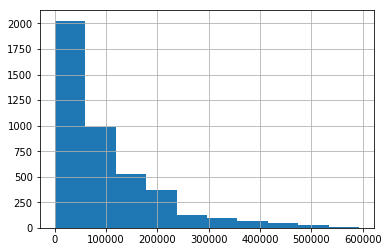

In [7]:
# Exploratory analysis of numerical values
numerical['target'].hist()

In [8]:
print('How many of the target values are zero?  {}'.format(numerical['target'].loc[numerical['target']==0].shape[0]))
print('Summarize the numerical data...')
numerical.describe()

How many of the target values are zero?  4
Summarize the numerical data...


,total # bedrooms in building,gallons per bedroom per month,target,gross bldg sq ft,if multi-family sum of apt sq ft,basement sq ft,# stories,"if multi-family, # units",# elevators,# of days in month,# of 0 bedroom units in building,# of 1 bedroom units in building,# of 2 bedroom units in building,# of 3 bedroom units in building,# of 4 bedroom units in building,# of 5 bedroom units in building,0 bedrooms - days vacant,1 bedrooms days vacant,2 bedrooms days vacant,3 bedrooms days vacant,4 bedrooms days vacant,5 bedrooms days vacant,# of 0 bedrooms * days in month,# of 1 bedrooms * days in month,# of 2 bedrooms * days in month,# of 3 bedrooms * days in month,# of 4 bedrooms * days in month,# of 5 bedrooms * days in month,0 bedrooms- days occupied,1 bedrooms - days occupied,2 bedrooms - days occupied,3 bedrooms - days occupied,4 bedrooms - days occupied,5 bedrooms - days occupied,0 bedroom number of vacant units,1 bedroom number of vacant units,2 bedroom number of vacant units,3 bedroom number of vacant units,4 bedroom number of vacant units,5 bedroom number of vacant units,bldg_age
count,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.00000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.0,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.000000,4282.0,4282.000000
mean,39.521018,2564.315151,97258.865249,26473.133582,18441.471042,2718.327884,3.259038,29.81574,0.385100,30.426903,10.985287,11.926670,5.253153,1.768333,0.183092,0.013078,21.232835,10.737039,5.574031,0.740542,0.060719,0.0,334.266464,362.850537,159.423167,53.801962,5.571228,0.397945,313.033629,352.113498,153.849136,53.061420,5.510509,0.397945,1.409855,0.903783,0.442083,0.062354,0.006539,0.0,59.573097
std,38.420322,1230.624687,101705.207525,27822.270441,19678.091189,3425.980027,1.760165,30.53881,0.665141,0.842353,20.740407,21.176773,9.615956,3.556669,0.553694,0.113622,68.765306,31.954651,20.127862,4.712891,1.261084,0.0,631.410444,644.540052,291.915491,108.258466,16.855271,3.458700,592.523058,628.152461,282.493574,107.346647,16.722001,3.458700,3.575844,3.154673,1.492498,0.361791,0.112121,0.0,43.358713
min,1.000000,0.000000,0.000000,853.000000,0.000000,0.000000,1.000000,0.00000,0.000000,28.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
25%,8.000000,1823.724900,21234.975000,4310.000000,3890.000000,0.000000,2.000000,3.00000,0.000000,30.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,16.000000
50%,26.000000,2336.144050,66724.349800,17176.600000,12500.000000,1224.000000,3.000000,23.00000,0.000000,31.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,48.000000
75%,61.000000,3000.991675,137072.730000,36000.000000,26611.000000,4554.000000,4.000000,51.00000,1.000000,31.000000,12.000000,17.000000,5.000000,2.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.0,372.000000,510.000000,155.000000,62.000000,0.000000,0.000000,360.000000,476.000000,155.000000,62.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.0,103.000000
max,166.000000,13112.000000,592877.000000,123355.000000,83968.000000,1852

In [9]:
# Dropped the 5-Bedroom Vacant values because they are all zero
numerical = numerical.drop(['5 bedroom number of vacant units', '5 bedrooms days vacant'], axis=1)

## Visualization Of Spearman Correlation Coefficients

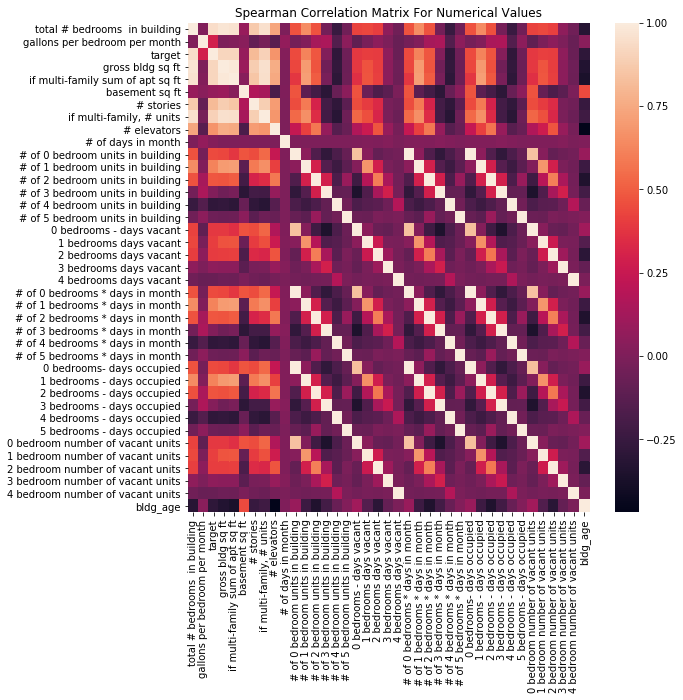

In [10]:
corrs = numerical.corr(method='spearman')
plt.subplots(figsize=(9, 9))
plt.title('Spearman Correlation Matrix For Numerical Values')
sns.heatmap(corrs)
plt.show()

In [11]:
print('Display a list of index-value pairs for the numerical values.  Used for slicing the data')
for i, j in enumerate(numerical.columns.tolist()):
    print('{}.  {}'.format(i, j))

Display a list of index-value pairs for the numerical values.  Used for slicing the data
0.  total # bedrooms  in building
1.  gallons per bedroom per month
2.  target
3.  gross bldg sq ft
4.  if multi-family sum of apt sq ft
5.  basement sq ft
6.  # stories
7.  if multi-family, # units
8.  # elevators
9.  # of days in month
10.  # of 0 bedroom units in building
11.  # of 1 bedroom units in building
12.  # of 2 bedroom units in building
13.  # of 3 bedroom units in building
14.  # of 4 bedroom units in building
15.  # of 5 bedroom units in building
16.  0 bedrooms - days vacant
17.  1 bedrooms days vacant
18.  2 bedrooms days vacant
19.  3 bedrooms days vacant
20.  4 bedrooms days vacant
21.  # of 0 bedrooms * days in month
22.  # of 1 bedrooms * days in month
23.  # of 2 bedrooms * days in month
24.  # of 3 bedrooms * days in month
25.  # of 4 bedrooms * days in month
26.  # of 5 bedrooms * days in month
27.  0 bedrooms- days occupied
28.  1 bedrooms - days occupied
29.  2 bedrooms - 

## Pairplots for Number of Bedrooms In the Building

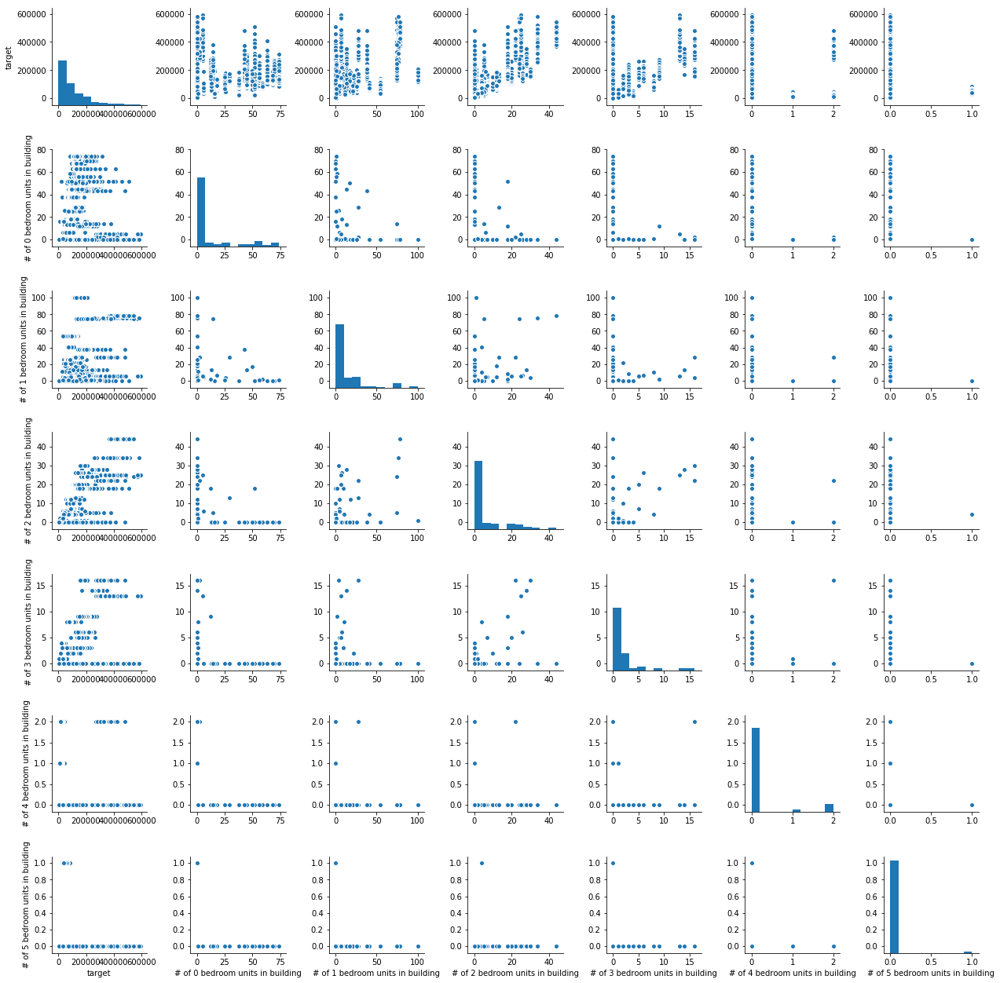

In [12]:
grp1 = [i for i in numerical.columns.tolist()[10:16] if i not in ['year', 'target']]
grp1.insert(0, 'target')
p = sns.pairplot(numerical[grp1])

## Pairplots for Number of Bedrooms * Days/Month

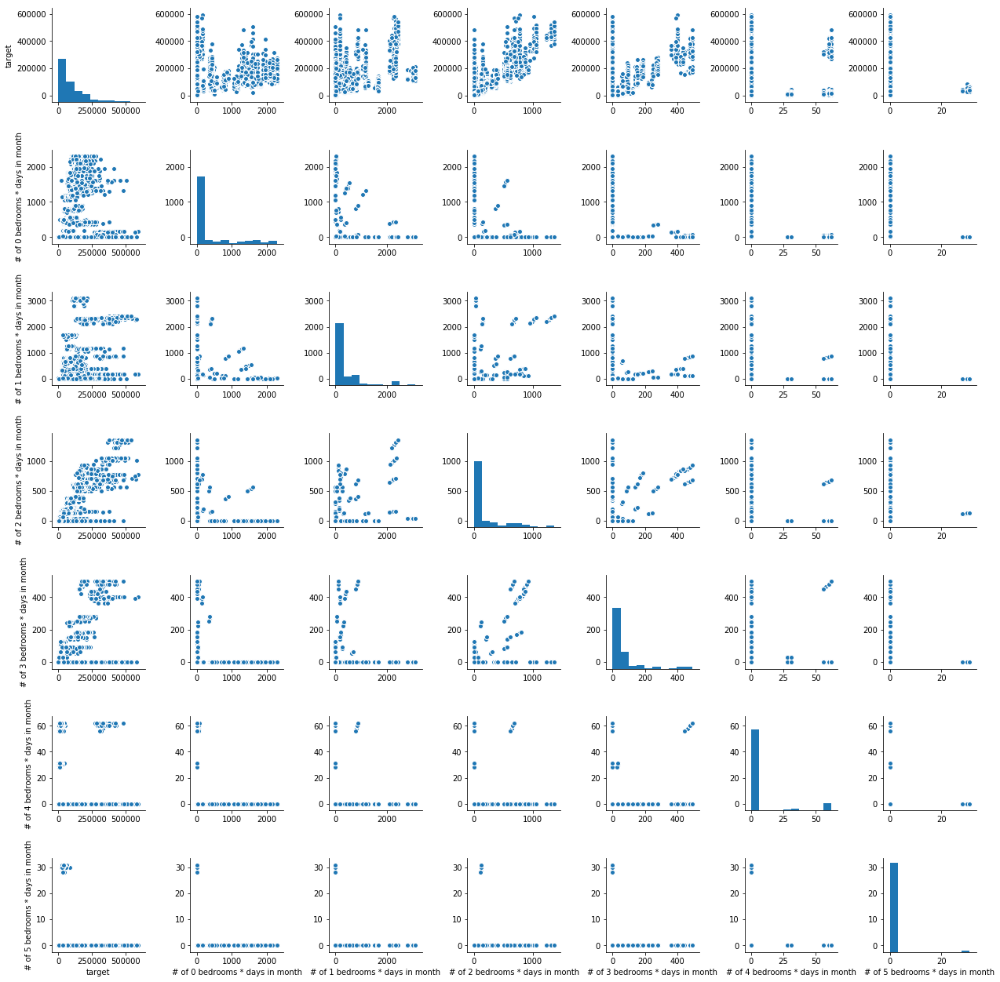

In [13]:
grp1 = [i for i in numerical.columns.tolist()[21:27] if i not in ['year', 'target']]
grp1.insert(0, 'target')
sns.pairplot(numerical[grp1])
plt.show()

# Pairplots for Number of Bedrooms - Days Vacant

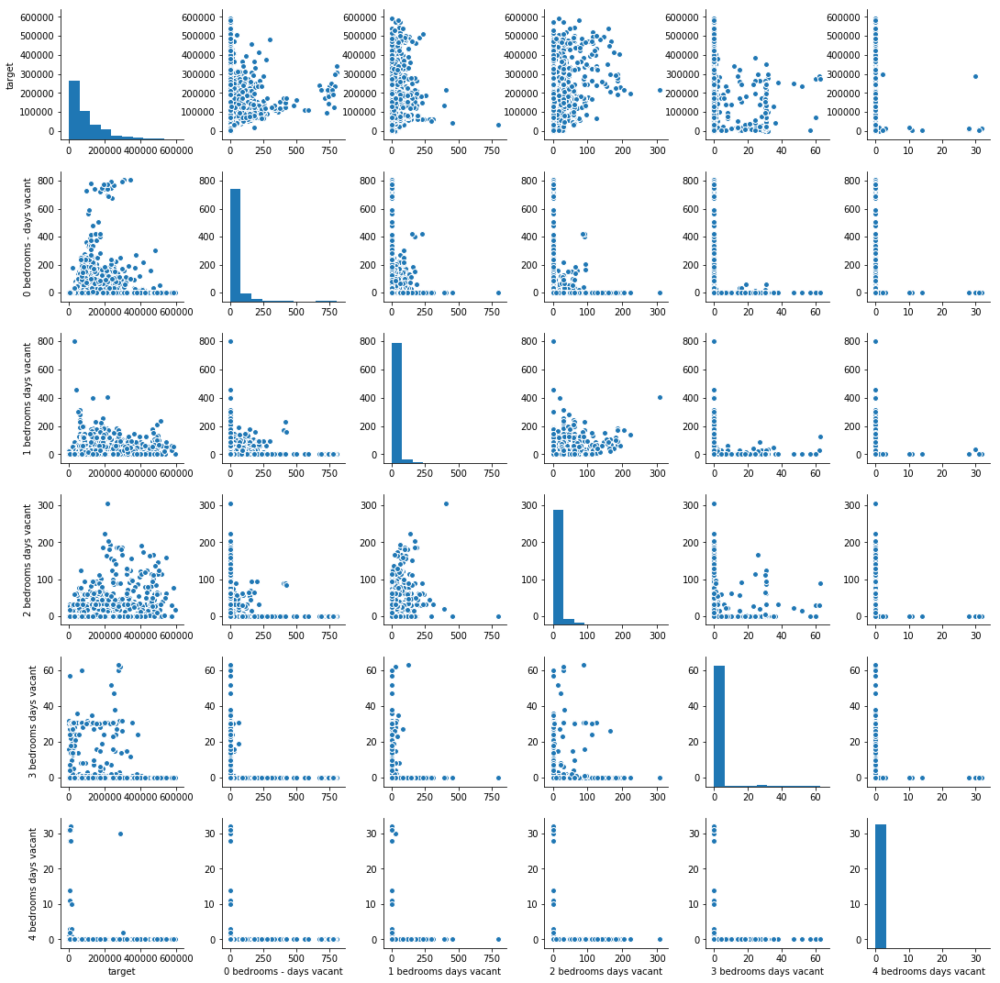

In [14]:
grp1 = [i for i in numerical.columns.tolist()[16:21] if i not in ['year', 'target']]
grp1.insert(0, 'target')
sns.pairplot(numerical[grp1])
plt.show()

## Pairplots for Number of Bedroom - Vacant Units

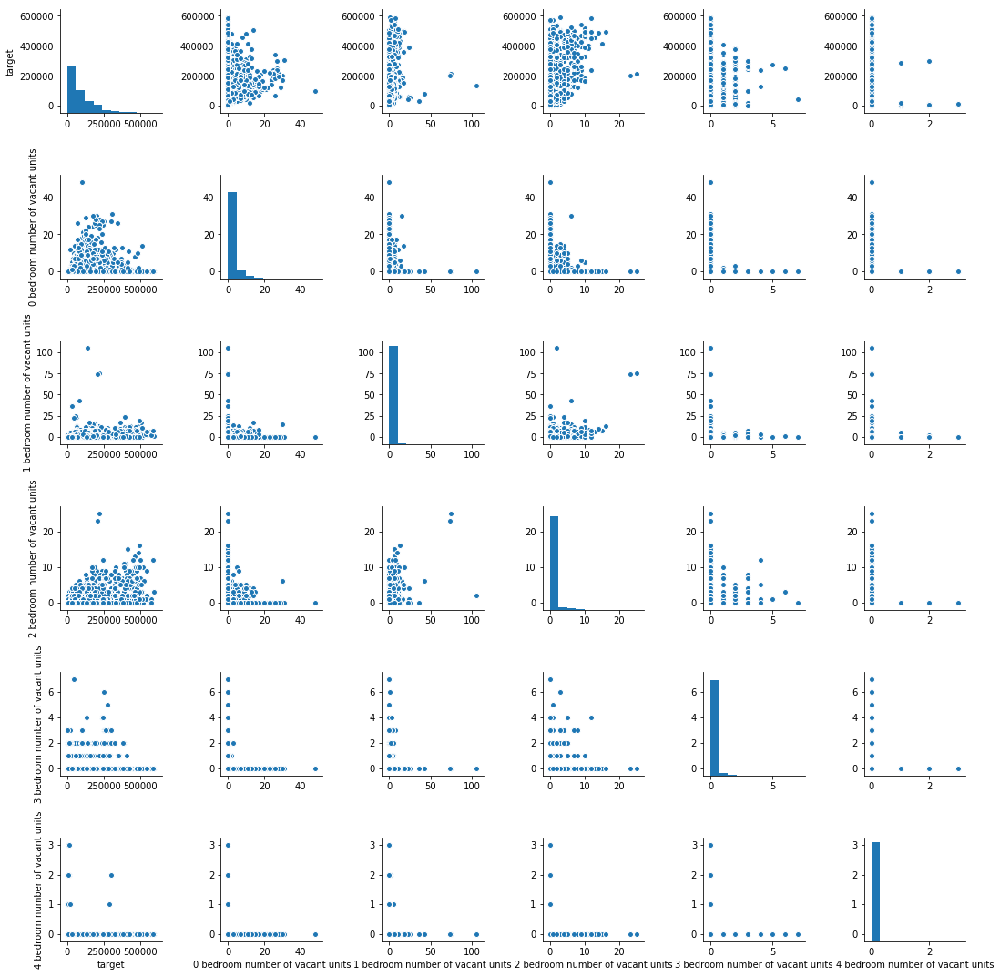

In [15]:
grp1 = [i for i in numerical.columns.tolist()[33:38] if i not in ['year', 'target']]
grp1.insert(0, 'target')
sns.pairplot(numerical[grp1])
plt.show()

##  Correlation Matrix Of Kept Variables

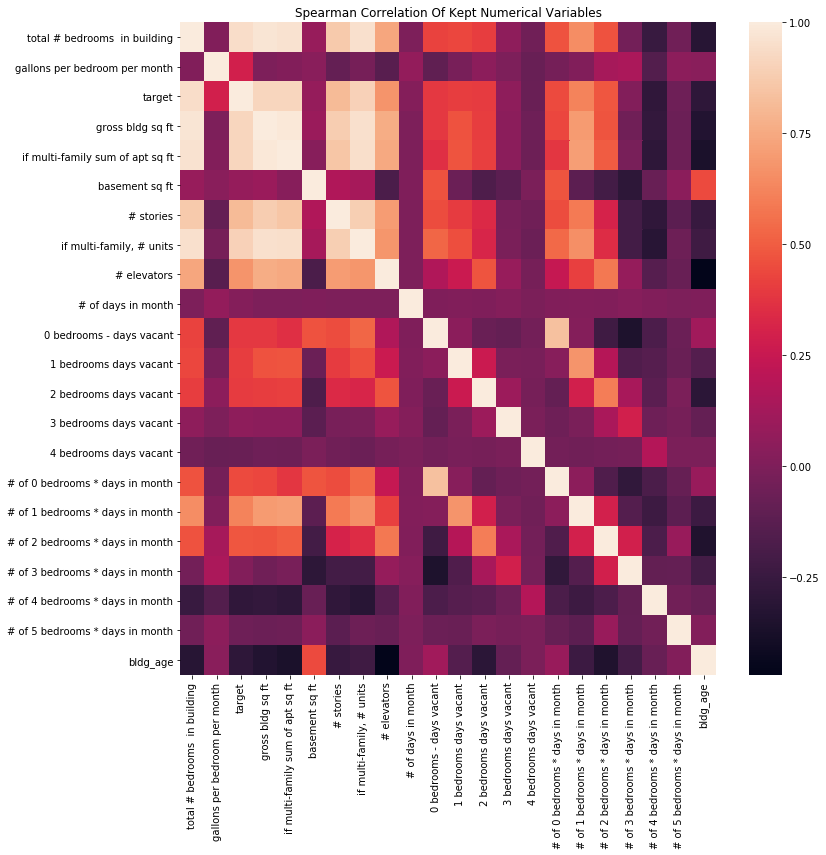

In [16]:
# Numerical Columns To Keep For Exploratory Analysis
cols=numerical.columns.tolist()
keep = cols[:10] + cols[16:27] + cols[38:]
keepnum_df = numerical[keep]
corrs = keepnum_df.corr(method='spearman')
plt.subplots(figsize=(12,12))
plt.title('Spearman Correlation Of Kept Numerical Variables')
sns.heatmap(corrs)
plt.show()

# Exploratory Analysis Of Categoricals

In [17]:
cats = df.loc[:, df.dtypes == 'object']
cats = pd.concat([cats[col].astype(str).str.lower() for col in cats.columns], axis=1)
cats.head()

,yardi building name,match building name,month,year,month start date,year built/gut rehabbed,single family?,single family building type,low-income housing,predominant resident type,type of construction,is there a basement?,is basement finished & heated?,environmental certification,if environmental certification: type,heating fuel,heating system,hot water system fuel,hot water system,cooling system,common laundry facilities,"if common laundry, dryer fuel"
0,1822 park,1822 park,august,2017,august 2017,1916,no,0,yes,mixed/none,masonry,yes,yes,no,0,natural gas,boiler (steam),natural gas,other,window ac,yes,natural gas
1,alliance addition 730 17th st south,alliance addition-730 17th street,august,2017,august 2017,1900,no,0,yes,mixed/none,wood or steel frame,yes,yes,yes,"leed, platinum",electricity,heat pump (air-source),electricity,stand-alone storage water heater,ducted central ac (outdoor condenser),yes,natural gas
2,archdale apartments 1600 south 1st ave,archdale,august,2017,august 2017,1919,no,0,yes,mixed/none,masonry,yes,yes,no,0,natural gas,boiler (steam),natural gas,stand-alone storage water heater,window ac,yes,natural gas
3,barnabas apartments 906 7th st s,st. barnabas,august,2017,august 2017,2005,no,0,yes,mixed/none,masonry,yes,yes,no,0,natural gas,boiler (hot water),natural gas,indirect hot water tank off boiler (heat & dhw),ducted central ac (outdoor condenser),yes,natural gas
4,buri manor 1515 chicago ave s,buri manor,august,2017,august 2017,1986,no,0,yes,mixed/none,wood or steel frame,no,no,no,0,electricity,electric baseboard,electricity,stand-alone storage water heater,window ac,yes,natural gas


Text(0.5,1,'Count Of Unique Categorical Variables')

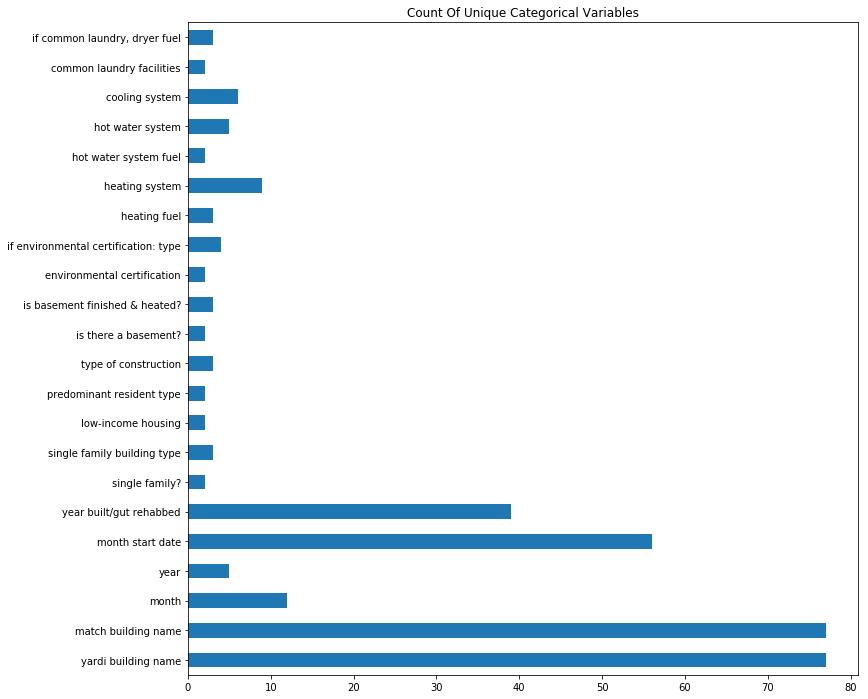

In [18]:
summary = cats.describe()
summary.loc['unique', :].plot(kind='barh', figsize=(12,12))
plt.title('Count Of Unique Categorical Variables')

In [19]:
summary

,yardi building name,match building name,month,year,month start date,year built/gut rehabbed,single family?,single family building type,low-income housing,predominant resident type,type of construction,is there a basement?,is basement finished & heated?,environmental certification,if environmental certification: type,heating fuel,heating system,hot water system fuel,hot water system,cooling system,common laundry facilities,"if common laundry, dryer fuel"
count,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282
unique,77,77,12,5,56,39,2,3,2,2,3,2,3,2,4,3,9,2,5,6,2,3
top,como by the lake 901 east como blvd,como by the lake 901 east como blvd,april,2016,april 2017,1900,no,0,yes,mixed/none,wood or steel frame,yes,yes,no,0,natural gas,furnace,natural gas,stand-alone storage water heater,window ac,yes,natural gas
freq,56,56,384,924,77,672,3946,2658,3725,4077,3446,2968,3024,3725,3725,3946,1512,4170,3187,2072,3834,3778


In [20]:
cols = cats.columns.tolist()
keepcats = cols[1:4]+cols[6:]
cats = cats[keepcats]
cats.head()

,match building name,month,year,single family?,single family building type,low-income housing,predominant resident type,type of construction,is there a basement?,is basement finished & heated?,environmental certification,if environmental certification: type,heating fuel,heating system,hot water system fuel,hot water system,cooling system,common laundry facilities,"if common laundry, dryer fuel"
0,1822 park,august,2017,no,0,yes,mixed/none,masonry,yes,yes,no,0,natural gas,boiler (steam),natural gas,other,window ac,yes,natural gas
1,alliance addition-730 17th street,august,2017,no,0,yes,mixed/none,wood or steel frame,yes,yes,yes,"leed, platinum",electricity,heat pump (air-source),electricity,stand-alone storage water heater,ducted central ac (outdoor condenser),yes,natural gas
2,archdale,august,2017,no,0,yes,mixed/none,masonry,yes,yes,no,0,natural gas,boiler (steam),natural gas,stand-alone storage water heater,window ac,yes,natural gas
3,st. barnabas,august,2017,no,0,yes,mixed/none,masonry,yes,yes,no,0,natural gas,boiler (hot water),natural gas,indirect hot water tank off boiler (heat & dhw),ducted central ac (outdoor condenser),yes,natural gas
4,buri manor,august,2017,no,0,yes,mixed/none,wood or steel frame,no,no,no,0,electricity,electric baseboard,electricity,stand-alone storage water heater,window ac,yes,natural gas


In [21]:
counts = [cats[i].value_counts() for i in cats.columns]
for c in counts:
    print(c)

como by the lake 901 east como blvd    56
alliance addition-730 17th street      56
chicago ave-1504                       56
roselle (elliot pk iv)                 56
chicago ave-1500                       56
phillips-2812-2814 portland            56
chicago ave-1508                       56
phillips-2828 portland                 56
renaissance box                        56
phillips-2805 cedar                    56
phillips-2315 bloomington              56
lamoreaux (ohp+exp)                    56
buri manor                             56
hope block-2026oakland                 56
barrington                             56
phillips-2217 portland                 56
1822 park                              56
phillips-2213 5th                      56
phillips-2200 bloomington              56
phillips-2305 portland                 56
elliot court                           56
paige hall                             56
hope block-2024oakland                 56
jourdain                          

In [22]:
## This is cleaning up mislabeled categorical variables
cats['single family?'].loc[cats['single family?'] == '0'] = 'no'
cats['type of construction'].loc[cats['type of construction'].str.contains('masonry')] = 'masonry'
cats['is there a basement?'].loc[cats['is there a basement?'] == '0'] = 'no'
cats['if environmental certification: type'].loc[cats['if environmental certification: type']=='0']='no'
cats['hot water system'].loc[cats['hot water system']=='0'] = 'no'
cats['is basement finished & heated?'].loc[cats['is basement finished & heated?']=='0']='no'

In [23]:
cats.describe()

,match building name,month,year,single family?,single family building type,low-income housing,predominant resident type,type of construction,is there a basement?,is basement finished & heated?,environmental certification,if environmental certification: type,heating fuel,heating system,hot water system fuel,hot water system,cooling system,common laundry facilities,"if common laundry, dryer fuel"
count,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282,4282
unique,77,12,5,2,3,2,2,2,2,2,2,4,3,9,2,5,6,2,3
top,como by the lake 901 east como blvd,april,2016,no,0,yes,mixed/none,wood or steel frame,yes,yes,no,no,natural gas,furnace,natural gas,stand-alone storage water heater,window ac,yes,natural gas
freq,56,384,924,3946,2658,3725,4077,3446,2968,3024,3725,3725,3946,1512,4170,3187,2072,3834,3778


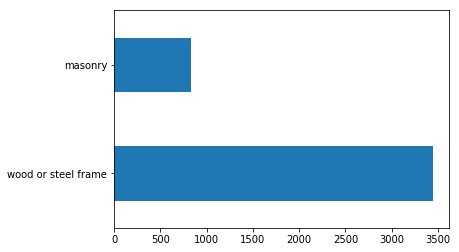

In [24]:
cats['type of construction'].value_counts().plot(kind='barh')

In [25]:
cats = cats.drop('year', axis=1)

In [26]:
out2 = pd.concat([df['match building name'], cats, keepnum_df], axis=1)

In [27]:
out2.to_csv('cleaned_df3.csv', index=False, encoding='utf-8')

# Creation Of Model

In [28]:
df = pd.read_csv('cleaned_df3.csv')
df = df.drop('gallons per bedroom per month', axis=1)
df.head()

,match building name,match building name.1,month,single family?,single family building type,low-income housing,predominant resident type,type of construction,is there a basement?,is basement finished & heated?,environmental certification,if environmental certification: type,heating fuel,heating system,hot water system fuel,hot water system,cooling system,common laundry facilities,"if common laundry, dryer fuel",total # bedrooms in building,target,gross bldg sq ft,if multi-family sum of apt sq ft,basement sq ft,# stories,"if multi-family, # units",# elevators,# of days in month,0 bedrooms - days vacant,1 bedrooms days vacant,2 bedrooms days vacant,3 bedrooms days vacant,4 bedrooms days vacant,# of 0 bedrooms * days in month,# of 1 bedrooms * days in month,# of 2 bedrooms * days in month,# of 3 bedrooms * days in month,# of 4 bedrooms * days in month,# of 5 bedrooms * days in month,bldg_age
0,1822 Park,1822 park,august,no,0,yes,mixed/none,masonry,yes,yes,no,no,natural gas,boiler (steam),natural gas,other,window ac,yes,natural gas,18,30862.9998,18000.0,9772,4500,4.0,18,0,31,0,0,0,0,0,0,558,0,0,0,0,101
1,Alliance Addition-730 17th Street,alliance addition-730 17th street,august,no,0,yes,mixed/none,wood or steel frame,yes,yes,yes,"leed, platinum",electricity,heat pump (air-source),electricity,stand-alone storage water heater,ducted central ac (outdoor condenser),yes,natural gas,61,78751.0000,33124.0,20790,7126,3.0,51,1,31,261,0,0,0,0,1829,62,0,0,0,0,117
2,Archdale,archdale,august,no,0,yes,mixed/none,masonry,yes,yes,no,no,natural gas,boiler (steam),natural gas,stand-alone storage water heater,window ac,yes,natural gas,30,117300.0000,19760.0,12178,4940,3.0,30,0,31,48,33,0,0,0,806,124,0,0,0,0,98
3,St. Barnabas,st. barnabas,august,no,0,yes,mixed/none,masonry,yes,yes,no,no,natural gas,boiler (hot water),natural gas,indirect hot water tank off boiler (heat & dhw),ducted central ac (outdoor condenser),yes,natural gas,52,88704.6004,32467.0,17316,6839,5.0,52,1,31,277,0,0,0,0,1612,0,0,0,0,0,12
4,Buri Manor,buri manor,august,no,0,yes,mixed/none,wood or steel frame,no,no,no,no,electricity,electric baseboard,electricity,stand-alone storage water heater,window ac,yes,natural gas,38,63680.7990,16464.0,9970,0,3.0,38,0,31,48,0,0,0,0,1178,0,0,0,0,0,31


In [29]:
cols = df.columns.tolist()
cols = [col for col in cols if not col.endswith('.1')]
df = df[cols]

In [30]:
df.columns.tolist()

['match building name',
 'month',
 'single family?',
 'single family building type',
 'low-income housing',
 'predominant resident type',
 'type of construction',
 'is there a basement?',
 'is basement finished & heated?',
 'environmental certification',
 'if environmental certification: type',
 'heating fuel',
 'heating system',
 'hot water system fuel',
 'hot water system',
 'cooling system',
 'common laundry facilities',
 'if common laundry, dryer fuel',
 'total # bedrooms  in building',
 'target',
 'gross bldg sq ft',
 'if multi-family sum of apt sq ft',
 'basement sq ft',
 '# stories',
 'if multi-family, # units',
 '# elevators',
 '# of days in month',
 '0 bedrooms - days vacant',
 '1 bedrooms days vacant',
 '2 bedrooms days vacant',
 '3 bedrooms days vacant',
 '4 bedrooms days vacant',
 '# of 0 bedrooms * days in month',
 '# of 1 bedrooms * days in month',
 '# of 2 bedrooms * days in month',
 '# of 3 bedrooms * days in month',
 '# of 4 bedrooms * days in month',
 '# of 5 bedrooms

In [31]:
df = df.rename(columns={'match building name': 'building'})
#df = df.drop('match building name.1', axis=1)

In [32]:
df.head()

,building,month,single family?,single family building type,low-income housing,predominant resident type,type of construction,is there a basement?,is basement finished & heated?,environmental certification,if environmental certification: type,heating fuel,heating system,hot water system fuel,hot water system,cooling system,common laundry facilities,"if common laundry, dryer fuel",total # bedrooms in building,target,gross bldg sq ft,if multi-family sum of apt sq ft,basement sq ft,# stories,"if multi-family, # units",# elevators,# of days in month,0 bedrooms - days vacant,1 bedrooms days vacant,2 bedrooms days vacant,3 bedrooms days vacant,4 bedrooms days vacant,# of 0 bedrooms * days in month,# of 1 bedrooms * days in month,# of 2 bedrooms * days in month,# of 3 bedrooms * days in month,# of 4 bedrooms * days in month,# of 5 bedrooms * days in month,bldg_age
0,1822 Park,august,no,0,yes,mixed/none,masonry,yes,yes,no,no,natural gas,boiler (steam),natural gas,other,window ac,yes,natural gas,18,30862.9998,18000.0,9772,4500,4.0,18,0,31,0,0,0,0,0,0,558,0,0,0,0,101
1,Alliance Addition-730 17th Street,august,no,0,yes,mixed/none,wood or steel frame,yes,yes,yes,"leed, platinum",electricity,heat pump (air-source),electricity,stand-alone storage water heater,ducted central ac (outdoor condenser),yes,natural gas,61,78751.0000,33124.0,20790,7126,3.0,51,1,31,261,0,0,0,0,1829,62,0,0,0,0,117
2,Archdale,august,no,0,yes,mixed/none,masonry,yes,yes,no,no,natural gas,boiler (steam),natural gas,stand-alone storage water heater,window ac,yes,natural gas,30,117300.0000,19760.0,12178,4940,3.0,30,0,31,48,33,0,0,0,806,124,0,0,0,0,98
3,St. Barnabas,august,no,0,yes,mixed/none,masonry,yes,yes,no,no,natural gas,boiler (hot water),natural gas,indirect hot water tank off boiler (heat & dhw),ducted central ac (outdoor condenser),yes,natural gas,52,88704.6004,32467.0,17316,6839,5.0,52,1,31,277,0,0,0,0,1612,0,0,0,0,0,12
4,Buri Manor,august,no,0,yes,mixed/none,wood or steel frame,no,no,no,no,electricity,electric baseboard,electricity,stand-alone storage water heater,window ac,yes,natural gas,38,63680.7990,16464.0,9970,0,3.0,38,0,31,48,0,0,0,0,1178,0,0,0,0,0,31


In [33]:
# Remove the building column as a label for later use
bldgs = df['building']
print('Number of unique buildings in the dataset:  {}'.format(len(set(bldgs))))
print('Drop the building labels from both datasets...')
df = df.drop(['building'], axis=1)

Number of unique buildings in the dataset:  77
Drop the building labels from both datasets...


Text(0.5,1,'Count of Unique Data On Each Building')

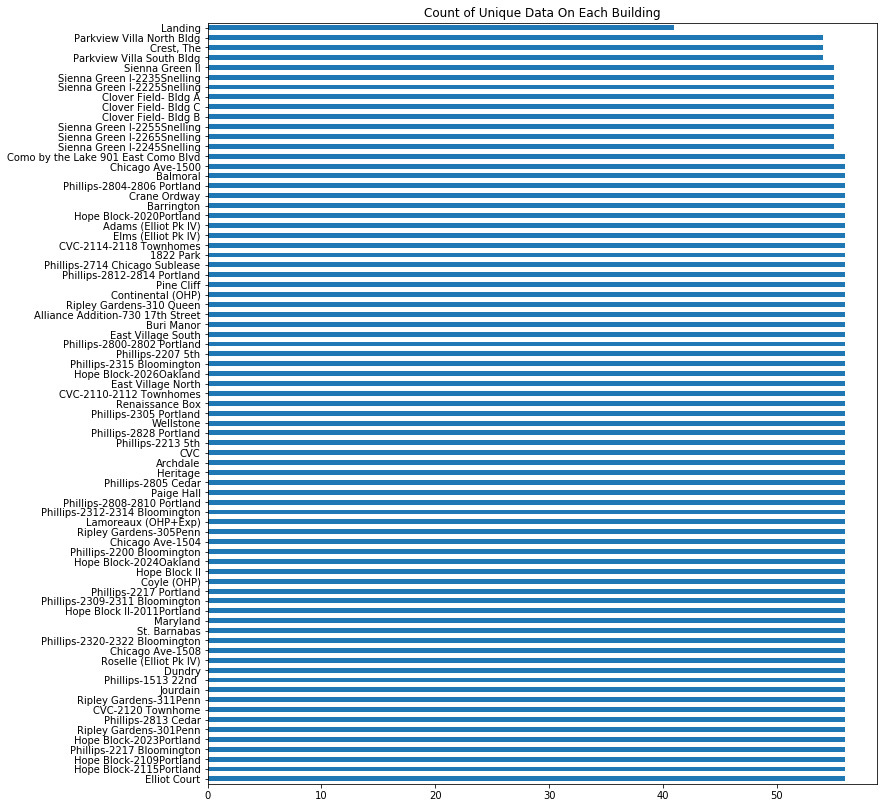

In [34]:
bldgs.value_counts().plot(kind='barh', figsize=(12,14))
plt.title('Count of Unique Data On Each Building')

In [35]:
print('Shape of the dataframe for training:  {}'.format(df.shape))
df.head()

Shape of the dataframe for training:  (4282, 38)


,month,single family?,single family building type,low-income housing,predominant resident type,type of construction,is there a basement?,is basement finished & heated?,environmental certification,if environmental certification: type,heating fuel,heating system,hot water system fuel,hot water system,cooling system,common laundry facilities,"if common laundry, dryer fuel",total # bedrooms in building,target,gross bldg sq ft,if multi-family sum of apt sq ft,basement sq ft,# stories,"if multi-family, # units",# elevators,# of days in month,0 bedrooms - days vacant,1 bedrooms days vacant,2 bedrooms days vacant,3 bedrooms days vacant,4 bedrooms days vacant,# of 0 bedrooms * days in month,# of 1 bedrooms * days in month,# of 2 bedrooms * days in month,# of 3 bedrooms * days in month,# of 4 bedrooms * days in month,# of 5 bedrooms * days in month,bldg_age
0,august,no,0,yes,mixed/none,masonry,yes,yes,no,no,natural gas,boiler (steam),natural gas,other,window ac,yes,natural gas,18,30862.9998,18000.0,9772,4500,4.0,18,0,31,0,0,0,0,0,0,558,0,0,0,0,101
1,august,no,0,yes,mixed/none,wood or steel frame,yes,yes,yes,"leed, platinum",electricity,heat pump (air-source),electricity,stand-alone storage water heater,ducted central ac (outdoor condenser),yes,natural gas,61,78751.0000,33124.0,20790,7126,3.0,51,1,31,261,0,0,0,0,1829,62,0,0,0,0,117
2,august,no,0,yes,mixed/none,masonry,yes,yes,no,no,natural gas,boiler (steam),natural gas,stand-alone storage water heater,window ac,yes,natural gas,30,117300.0000,19760.0,12178,4940,3.0,30,0,31,48,33,0,0,0,806,124,0,0,0,0,98
3,august,no,0,yes,mixed/none,masonry,yes,yes,no,no,natural gas,boiler (hot water),natural gas,indirect hot water tank off boiler (heat & dhw),ducted central ac (outdoor condenser),yes,natural gas,52,88704.6004,32467.0,17316,6839,5.0,52,1,31,277,0,0,0,0,1612,0,0,0,0,0,12
4,august,no,0,yes,mixed/none,wood or steel frame,no,no,no,no,electricity,electric baseboard,electricity,stand-alone storage water heater,window ac,yes,natural gas,38,63680.7990,16464.0,9970,0,3.0,38,0,31,48,0,0,0,0,1178,0,0,0,0,0,31


In [36]:
# Need to split up the dataframes into categoricals and numericals
cats = df.loc[:, 'month':'if common laundry, dryer fuel']
nums = df.loc[:, 'total # bedrooms  in building':]
nums = nums.drop('target', axis=1)
targets = df['target'].copy()
cats.head()

,month,single family?,single family building type,low-income housing,predominant resident type,type of construction,is there a basement?,is basement finished & heated?,environmental certification,if environmental certification: type,heating fuel,heating system,hot water system fuel,hot water system,cooling system,common laundry facilities,"if common laundry, dryer fuel"
0,august,no,0,yes,mixed/none,masonry,yes,yes,no,no,natural gas,boiler (steam),natural gas,other,window ac,yes,natural gas
1,august,no,0,yes,mixed/none,wood or steel frame,yes,yes,yes,"leed, platinum",electricity,heat pump (air-source),electricity,stand-alone storage water heater,ducted central ac (outdoor condenser),yes,natural gas
2,august,no,0,yes,mixed/none,masonry,yes,yes,no,no,natural gas,boiler (steam),natural gas,stand-alone storage water heater,window ac,yes,natural gas
3,august,no,0,yes,mixed/none,masonry,yes,yes,no,no,natural gas,boiler (hot water),natural gas,indirect hot water tank off boiler (heat & dhw),ducted central ac (outdoor condenser),yes,natural gas
4,august,no,0,yes,mixed/none,wood or steel frame,no,no,no,no,electricity,electric baseboard,electricity,stand-alone storage water heater,window ac,yes,natural gas


In [37]:
# Numerical Variables Kept For Modeling
nums.columns.tolist()

['total # bedrooms  in building',
 'gross bldg sq ft',
 'if multi-family sum of apt sq ft',
 'basement sq ft',
 '# stories',
 'if multi-family, # units',
 '# elevators',
 '# of days in month',
 '0 bedrooms - days vacant',
 '1 bedrooms days vacant',
 '2 bedrooms days vacant',
 '3 bedrooms days vacant',
 '4 bedrooms days vacant',
 '# of 0 bedrooms * days in month',
 '# of 1 bedrooms * days in month',
 '# of 2 bedrooms * days in month',
 '# of 3 bedrooms * days in month',
 '# of 4 bedrooms * days in month',
 '# of 5 bedrooms * days in month',
 'bldg_age']

In [38]:
cats.columns.tolist()

['month',
 'single family?',
 'single family building type',
 'low-income housing',
 'predominant resident type',
 'type of construction',
 'is there a basement?',
 'is basement finished & heated?',
 'environmental certification',
 'if environmental certification: type',
 'heating fuel',
 'heating system',
 'hot water system fuel',
 'hot water system',
 'cooling system',
 'common laundry facilities',
 'if common laundry, dryer fuel']

In [39]:
cats_ = pd.get_dummies(cats)
cats_.head()

,month_april,month_august,month_december,month_february,month_january,month_july,month_june,month_march,month_may,month_november,month_october,month_september,single family?_no,single family?_yes,single family building type_0,single family building type_detached,single family building type_shared wall,low-income housing_no,low-income housing_yes,predominant resident type_elderly,predominant resident type_mixed/none,type of construction_masonry,type of construction_wood or steel frame,is there a basement?_no,is there a basement?_yes,is basement finished & heated?_no,is basement finished & heated?_yes,environmental certification_no,environmental certification_yes,"if environmental certification: type_leed, gold","if environmental certification: type_leed, platinum",if environmental certification: type_no,if environmental certification: type_other (type in),heating fuel_electricity,heating fuel_natural gas,heating fuel_steam,heating system_boiler (high efficiency condensing),heating system_boiler (hot water),heating system_boiler (steam),heating system_electric baseboard,heating system_furnace,heating system_furnace (high efficiency condensing),heating system_heat pump (air-source),heating system_heat pump (ground-source),heating system_ptac units,hot water system fuel_electricity,hot water system fuel_natural gas,hot water system_indirect hot water tank off boiler (heat & dhw),hot water system_indirect hot water tank off dedicated boiler,hot water system_no,hot water system_other,hot water system_stand-alone storage water heater,cooling system_air-cooled chiller,cooling system_ducted central ac (outdoor condenser),cooling system_packaged rooftop cooling system,cooling system_ptac unit,cooling system_room ac in sleeve (through wall ),cooling system_window ac,common laundry facilities_no,common laundry facilities_yes,"if common laundry, dryer fuel_0","if common laundry, dryer fuel_electricity","if common laundry, dryer fuel_natural gas"
0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,1,1,0,0,1,0,1,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,1
1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1
2,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,1,1,0,0,1,0,1,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1
3,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,1,1,0,0,1,0,1,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1
4,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,1,0,1,1,0,1,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1


In [40]:
# Concatenate the targets, the buildings, the categorical variables, and the numerical variables, then create a validation set which should be dropped from the training dataset
X_df = pd.concat([ bldgs, targets, cats_, nums], axis=1)
print(X_df['target'].describe())
print('Size of the dataset:  {}'.format(X_df.shape))
valid_set = X_df.sample(frac=0.2)
print('Size of the validation set:  {}'.format(valid_set.shape))
print('Dropping the validation samples...')
X_df = X_df.loc[~X_df.index.isin(valid_set.index)].copy()
print('Size of the new training set is:  {}'.format(X_df.shape))

count      4282.000000
mean      97258.865249
std      101705.207525
min           0.000000
25%       21234.975000
50%       66724.349800
75%      137072.730000
max      592877.000000
Name: target, dtype: float64
Size of the dataset:  (4282, 85)
Size of the validation set:  (856, 85)
Dropping the validation samples...
Size of the new training set is:  (3426, 85)


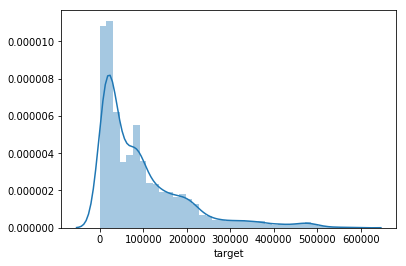

In [41]:
sns.distplot(X_df['target'])

In [42]:
def create_dsets(df):
    target = df['target'].values
    bldgs = df['building'].tolist()
    X = df.drop(['target', 'building'], axis=1)
    features = X.columns.tolist()
    X = X.values
    return X, target, bldgs, features

In [47]:
def makeplot(estimator, X, y, X_valid, y_valid, title):#, score, mse=None, mae=None):
    predicted = estimator.predict(X)
    pred_valid = estimator.predict(X_valid)
    
    score = "Training R2 Score:  {}".format(estimator.score(X, y))
    score2 = "Validation R2 Score:  {}".format(estimator.score(X_valid, y_valid))

    mse = "Training MSE:  {}".format(mean_squared_error(y, estimator.predict(X)))
    mse2 = "Validation MSE:  {}".format(mean_squared_error(y_valid, estimator.predict(X_valid)))

    mae = 'Training Median Absolute Error is:  {}'.format(median_absolute_error(y, estimator.predict(X)))
    mae2 = 'Validation Median Absolute Error is:  {}'.format(median_absolute_error(y_valid, estimator.predict(X_valid)))

    plt.figure(figsize=(15,9))
    plt.title(title)
    
    plt.scatter(y, y)
    plt.scatter(y, predicted, edgecolors='red', facecolors='none')
    plt.scatter(y_valid, pred_valid, edgecolors='green', facecolors='green')
    
    plt.annotate(score, xy=(0.05, .86), xycoords='axes fraction')
    plt.annotate(score2, xy=(.05, .84), xycoords='axes fraction')
    
    plt.annotate(mse, xy=(.05, .82), xycoords='axes fraction')
    plt.annotate(mse2, xy=(.05, .80), xycoords='axes fraction')


    plt.annotate(mae, xy=(.05, .78), xycoords='axes fraction')
    plt.annotate(mae2, xy=(.05, .76), xycoords='axes fraction')


    plt.annotate('Blue = Actual', xy=(.05, .90), xycoords='axes fraction')
    plt.annotate('Red = Predicted', xy=(.05, .88), xycoords='axes fraction')
    plt.annotate('Green = Validation', xy=(0.05, 0.92), xycoords='axes fraction')
    
    plt.xlabel('Actual Water Consumption per Building')
    plt.ylabel('Predicted Water Consumption per Building')
    plt.show()

In [48]:
# Create the matrices for training a model, the target values, list of building names, and the featurenames for both the training data, and the validation data
X, y, bldgs, features = create_dsets(X_df)
X_valid, y_valid, bldgs_valid, _ = create_dsets(valid_set)

## Benchmark Linear Regression

Average training score is:  0.0


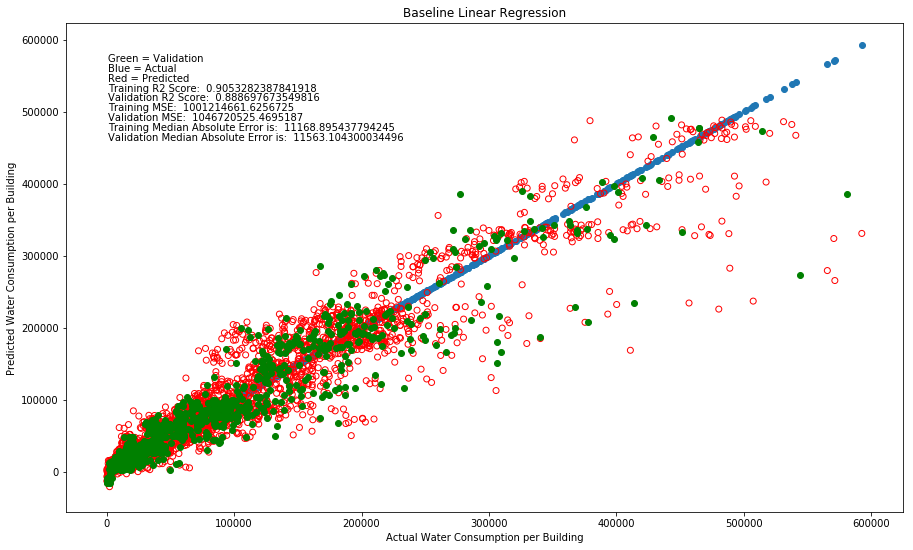

In [49]:
scores = []
lr = linear_model.LinearRegression()
loo = LeaveOneOut()
for train_idx, test_idx in loo.split(X, y):
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    lr.fit(X_train, y_train)
    scores.append(lr.score(X_test, y_test))
print('Average training score is:  {}'.format(np.mean(scores)))
makeplot(estimator=lr, X=X, y=y, X_valid=X_valid, y_valid=y_valid, title='Baseline Linear Regression')

## Single Level Decision Tree

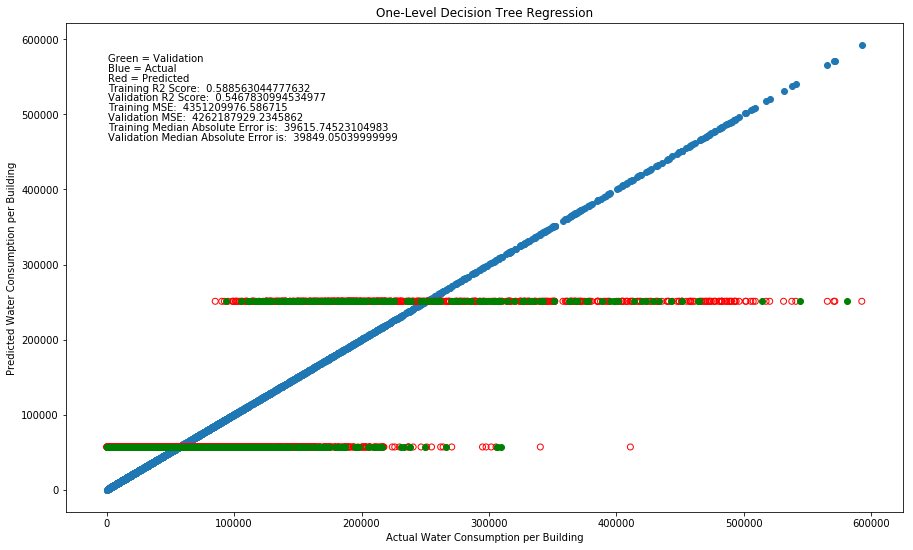

In [50]:
scores = []
clf_ = DecisionTreeRegressor(max_depth=1)
loo_ = LeaveOneOut
for train_idx, test_idx in loo.split(X, y):
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    clf_.fit(X_train, y_train)
    scores.append(clf_.score(X_test, y_test))
makeplot(estimator=clf_, X=X, y=y, 
         X_valid=X_valid, y_valid=y_valid, title='One-Level Decision Tree Regression')

## Decision Tree Regressor

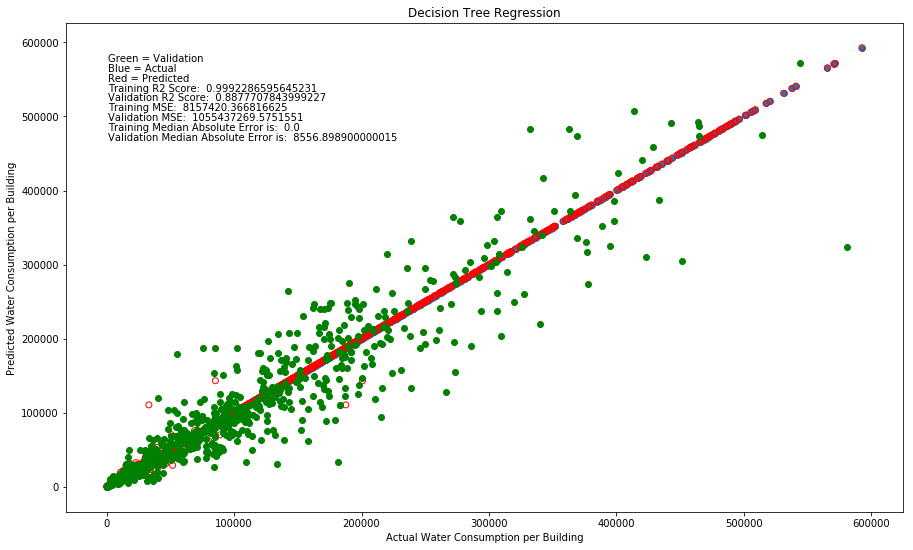

In [61]:
clf = DecisionTreeRegressor()
clf.fit(X, y)
makeplot(estimator=clf, X=X, y=y, 
         X_valid=X_valid, y_valid=y_valid, title='Decision Tree Regression')

## Decision Tree Trained with Leave One Out Cross-Validation

Averge model score during training is:  0.0049620548744892


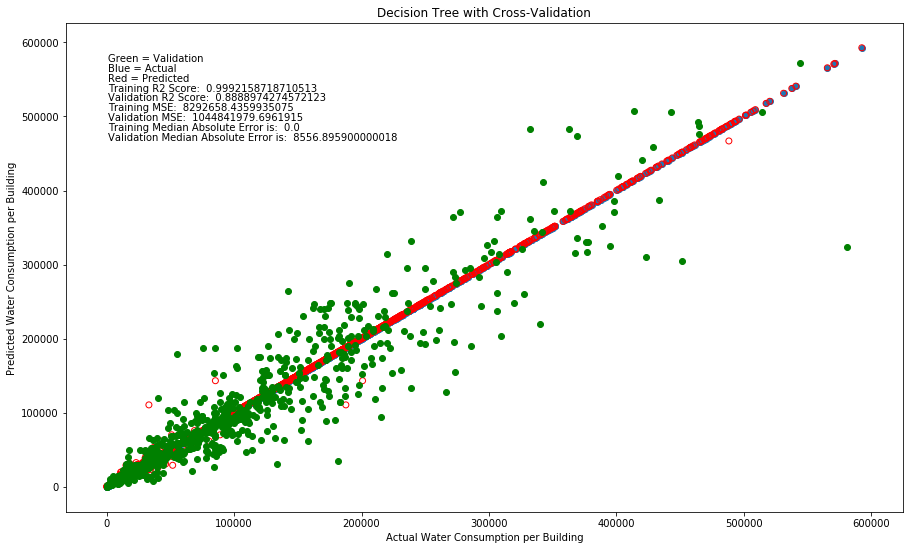

In [52]:
scores = []
clf = DecisionTreeRegressor()
loo = LeaveOneOut()
for train_idx, test_idx in loo.split(X, y):
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    clf.fit(X_train, y_train)
    scores.append(clf.score(X_test, y_test))
print('Averge model score during training is:  {}'.format(np.mean(scores)))
makeplot(estimator=clf, X=X, y=y, X_valid=X_valid, y_valid=y_valid, title='Decision Tree with Cross-Validation')

# Decision Tree Trained With Group Shuffle-Split Cross-Validation

Number of splits during training:  7
Averge model score during training is:  0.43647788288200573


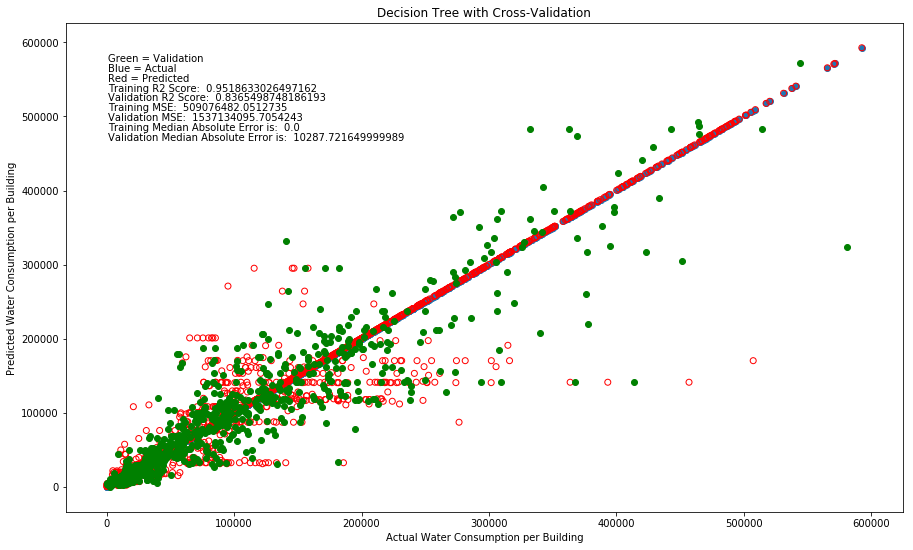

In [53]:
scores = []
clf = DecisionTreeRegressor()
gso = GroupShuffleSplit(n_splits=7)
print('Number of splits during training:  {}'.format(gso.get_n_splits(X, y, groups=bldgs)))
for train_idx, test_idx in gso.split(X, y, groups=bldgs):
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    clf.fit(X_train, y_train)
    scores.append(clf.score(X_test, y_test))
print('Averge model score during training is:  {}'.format(np.mean(scores)))
makeplot(estimator=clf, X=X, y=y, X_valid=X_valid, y_valid=y_valid, title='Decision Tree with Cross-Validation')

In [62]:
# Save the trained model
joblib.dump(clf, os.path.join('trained_model.pkl'))

['trained_model.pkl']

In [63]:
clfplot=export_graphviz(clf, out_file='my_tree.dot', feature_names=features)
with open('my_tree.dot') as f:
    dot_graph=f.read()
graphviz.Source(dot_graph)

In [56]:
# Save the test data to a csv file
df_ = pd.DataFrame(data=X_valid, index=bldgs_valid, columns=features)
df_.to_csv(os.path.join('model', 'test_data.csv'), encoding='utf-8', index_label='buildings')

In [57]:
# These are the predictions on the data from the trained model...
p = pd.DataFrame(data=clf.predict(X_valid), index=bldgs_valid, columns=['Predicted Monthly Water Consumption'])
p = pd.concat([p, df_], axis=1)
p.to_csv(os.path.join('model', 'predictions_test.csv'), encoding='utf-8', index_label='buildings')


# How To Make It Consumable?

In [58]:
def tree_to_code(tree, feature_names):
    tree_ = tree.tree_
    feature_name = [
        feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]
#    print("def tree({}):".format(", ".join(feature_names)))

    def recurse(node, depth):
        indent = "  " * depth
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            print("{} if {} <= {}:".format(indent, name, threshold))
            recurse(tree_.children_left[node], depth + 1)
            print("{}else: if {} > {}".format(indent, name, threshold))
            recurse(tree_.children_right[node], depth + 1)
        else:
            print("{} return {}".format(indent, tree_.value[node]))

    recurse(0, 1)

In [59]:
# For a simple model...
tree_to_code(clf_, feature_names=features)

   if total # bedrooms  in building <= 69.0:
     return [[ 56772.79476895]]
  else: if total # bedrooms  in building > 69.0
     return [[ 250982.97795915]]


In [60]:
# For the actual model
tree_to_code(clf, feature_names=features)

   if if multi-family sum of apt sq ft <= 31363.5:
     if if multi-family sum of apt sq ft <= 12151.0:
       if total # bedrooms  in building <= 9.5:
         if if multi-family, # units <= 1.0:
           if bldg_age <= 10.5:
             if month_august <= 0.5:
               if month_october <= 0.5:
                 if month_november <= 0.5:
                   if month_july <= 0.5:
                     if month_june <= 0.5:
                       if # of days in month <= 30.5:
                         if # of 3 bedrooms * days in month <= 29.0:
                           return [[ 8177.25]]
                        else: if # of 3 bedrooms * days in month > 29.0
                           return [[ 7963.5699]]
                      else: if # of days in month > 30.5
                         if month_march <= 0.5:
                           if month_january <= 0.5:
                             return [[ 10786.7001]]
                          else: if month_january > 0.5
            

                     return [[ 1954.45]]
                  else: if month_february > 0.5
                     return [[ 3860.65]]
            else: if gross bldg sq ft > 2148.5
               if 3 bedrooms days vacant <= 22.5:
                 if bldg_age <= 114.5:
                   if month_april <= 0.5:
                     if month_june <= 0.5:
                       if month_july <= 0.5:
                         if month_december <= 0.5:
                           if month_january <= 0.5:
                             if month_august <= 0.5:
                               if bldg_age <= 113.5:
                                 if month_november <= 0.5:
                                   if month_march <= 0.5:
                                     if month_february <= 0.5:
                                       return [[ 5723.8101]]
                                    else: if month_february > 0.5
                                       return [[ 5584.1499]]
                           

                                        else: if month_december > 0.5
                                           return [[ 19400.8]]
                                      else: if month_may > 0.5
                                         return [[ 18662.4]]
                                    else: if month_march > 0.5
                                       return [[ 17813.2]]
                                  else: if month_january > 0.5
                                     return [[ 15829.6]]
                                else: if month_september > 0.5
                                   return [[ 15766.9]]
                        else: if month_july > 0.5
                           if bldg_age <= 22.5:
                             if bldg_age <= 20.5:
                               if bldg_age <= 19.5:
                                 return [[ 20438.7]]
                              else: if bldg_age > 19.5
                                 return [[ 22744.16666667]]
               

                                           return [[ 48184.8003]]
                                      else: if month_august > 0.5
                                         return [[ 40771.6995]]
                                    else: if 1 bedrooms days vacant > 3.5
                                       return [[ 50880.4002]]
                              else: if month_february > 0.5
                                 if bldg_age <= 46.5:
                                   return [[ 61977.4995]]
                                else: if bldg_age > 46.5
                                   return [[ 56629.2006]]
                            else: if 1 bedrooms days vacant > 17.0
                               return [[ 32404.4994]]
                          else: if 1 bedrooms days vacant > 21.0
                             if 1 bedrooms days vacant <= 25.5:
                               return [[ 68617.9998]]
                            else: if 1 bedrooms days vacant > 25.5
          

                           if month_august <= 0.5:
                             if bldg_age <= 98.5:
                               return [[ 65441.1004]]
                            else: if bldg_age > 98.5
                               return [[ 60857.7008]]
                          else: if month_august > 0.5
                             return [[ 70051.3008]]
                        else: if 1 bedrooms days vacant > 41.0
                           return [[ 101666.9992]]
                  else: if 1 bedrooms days vacant > 52.0
                     if month_september <= 0.5:
                       if # of 0 bedrooms * days in month <= 396.5:
                         if month_april <= 0.5:
                           return [[ 60474.7]]
                        else: if month_april > 0.5
                           return [[ 60110.7]]
                      else: if # of 0 bedrooms * days in month > 396.5
                         return [[ 57916.7992]]
                    else: if mont

                  else: if 2 bedrooms days vacant > 1.0
                     if 2 bedrooms days vacant <= 44.5:
                       if 2 bedrooms days vacant <= 29.0:
                         if month_april <= 0.5:
                           if 3 bedrooms days vacant <= 4.0:
                             if 2 bedrooms days vacant <= 15.0:
                               return [[ 71875.7]]
                            else: if 2 bedrooms days vacant > 15.0
                               return [[ 71607.0992]]
                          else: if 3 bedrooms days vacant > 4.0
                             return [[ 68645.6004]]
                        else: if month_april > 0.5
                           return [[ 75513.0012]]
                      else: if 2 bedrooms days vacant > 29.0
                         if bldg_age <= 99.5:
                           if month_june <= 0.5:
                             return [[ 79888.9988]]
                          else: if month_june > 0.5
        

                                               return [[ 123878.0009]]
                                        else: if month_august > 0.5
                                           return [[ 124611.0013]]
                                      else: if month_september > 0.5
                                         return [[ 124676.9972]]
                                    else: if month_march > 0.5
                                       return [[ 117289.0005]]
                                  else: if month_july > 0.5
                                     return [[ 129058.9993]]
                                else: if month_june > 0.5
                                   return [[ 133684.001]]
                              else: if 1 bedrooms days vacant > 14.5
                                 if # of 1 bedrooms * days in month <= 183.0:
                                   return [[ 111393.9971]]
                                else: if # of 1 bedrooms * days in month > 183.0
          

              else: if 0 bedrooms - days vacant > 38.0
                 if bldg_age <= 3.0:
                   if # of 0 bedrooms * days in month <= 884.5:
                     return [[ 174698.0016]]
                  else: if # of 0 bedrooms * days in month > 884.5
                     return [[ 179941.0037]]
                else: if bldg_age > 3.0
                   if bldg_age <= 5.5:
                     if month_january <= 0.5:
                       if 1 bedrooms days vacant <= 1.5:
                         if bldg_age <= 4.5:
                           if 0 bedrooms - days vacant <= 80.0:
                             return [[ 147970.0013]]
                          else: if 0 bedrooms - days vacant > 80.0
                             return [[ 143930.9972]]
                        else: if bldg_age > 4.5
                           if # of 0 bedrooms * days in month <= 884.5:
                             if # of 1 bedrooms * days in month <= 826.0:
                             

In [ ]:
# How about we create an executable instead...